# Convert Air Team Data from GeoTiff to CSV
Current Air Data is in 162 GeoTiffs. Would like to have 2 CSV files, 1 for 4km and 1 for 1km.

The goal is to make the spatial join with the Housing Unit level data faster.

Code also makes a vector version of the the grids. This will be joined with the point level data. After this join the CSV for the air data will be merged on the grid id.


## Description of Program
- program:    ip1_2av2_airgridtogpkg
- task:       Convert Air Grid to gpkg
- Version:    2025-12-19 - ip1_2av1_convertairtocsv
- v2          2026-02-04 - save grid no data as geopackage 
                           Will be used to merge with csv versions of air data
                           This will speed up integration with HUA points
                           Add study sites for context in exploration
- project:    Southeast Texas Urban Integrated Field Lab
- funding:	  DOE
- author:     Nathanael Rosenheim

## Step 0: Good Housekeeping

In [1]:
# 1. Import all packages
import pandas as pd     # For obtaining and cleaning tabular data
import geopandas as gpd # For obtaining and cleaning spatial data
import matplotlib.pyplot as plt # For plotting
import contextily as ctx # For adding basemaps
import os # For saving output to path
import zipfile # For handling zip files
import io # For handling in-memory data
import requests # For downloading data
import rasterio # For reading geotiff files
from datetime import datetime

In [2]:
# 2. Check versions
import sys
print("Python Version     ", sys.version)
print("geopandas version: ", gpd.__version__)

Python Version      3.13.9 | packaged by conda-forge | (main, Oct 22 2025, 23:12:41) [MSC v.1944 64 bit (AMD64)]
geopandas version:  1.1.1


In [3]:
# 3. Check working directory
# Get information on current working directory (getcwd)
os.getcwd()

'c:\\Users\\nathanael99\\MyProjects\\GitHub\\integrate_people_theme1_cookbook'

In [4]:
#4. Store Program Name for output files to have the same name
programname = "ip1_2av2_airgridtogpkg"
# Make directory to save output
if not os.path.exists(programname):
    os.mkdir(programname)

# Step 1: Obtain Data
Obtain publicly available data on CKAN

https://ckan.tacc.utexas.edu/organization/setx-uifl


In [5]:
# task force sites
data_title = "Task Force Top Two Focus Sites"
url = "https://ckan.tacc.utexas.edu/dataset/cfe91d1b-3aa9-4de1-ba76-2837deb87649/resource/7e2e3d0e-60cc-4fb1-beea-d30a62cdd1e9/download/task_force_sites_top_focus_may_2024.zip"

tfsites_gdf = gpd.read_file(url)
tfsites_gdf.head()

,Shape_Leng,Shape_Area,Site_Name,geometry
0,0.0,0.0,West Port Arthur - Foley Watershed,"POLYGON Z ((-10458830.588 3488032.728 0, -1045..."
1,0.0,0.0,Southeast Beaumont - Hillebrant Bayou/Tenmile ...,"POLYGON Z ((-10476419.371 3513315.472 0, -1047..."


In [6]:
# Shorten Site names remove text after the hyphen
tfsites_gdf['Site_Name'] = tfsites_gdf['Site_Name'].str.split(' - ').str[0]
tfsites_gdf.head()

,Shape_Leng,Shape_Area,Site_Name,geometry
0,0.0,0.0,West Port Arthur,"POLYGON Z ((-10458830.588 3488032.728 0, -1045..."
1,0.0,0.0,Southeast Beaumont,"POLYGON Z ((-10476419.371 3513315.472 0, -1047..."


### Simulated Percentile Concentrations of Hazardous Air Pollutants in Southeast Texas from the Comprehensive Air Quality Model with Extensions
https://ckan.tacc.utexas.edu/dataset/simulated-percentile-concentrations-of-hazardous-air-pollutants

Each file is named according to the following:

Authors: Elena McDonald-Buller; Yosuke Kimura

v720ut3_uifl_4km_1km_rtracv3_*_{gridname}_{species}_ppb_apr_oct_{statistics}.tif

- gridname is grd01 or grd02 specifying the modeling domain, uifl_4km or uifl_1km, respectively
- species can be antl (Acetonitrile), be13 (1,3-Butadiene), benz (Benzene), etbz (Ethylbenzene), etox (Ethylene Oxide), nhex (Hexane), strn (Styrene), tolu (Toluene) or xyln (mixed isomers of Xylenes).
- statistics has the format of pXX where XX is percentile, e.g. p50 represents the 50th percentile, or the word "mean" for mean.


In [7]:
# Add Air Pollution Data
air_pollution_url = "https://ckan.tacc.utexas.edu/dataset/c3c1b2b2-4d43-4603-b1c5-fc0877c279ae/resource/465209c8-f407-4eb2-99b3-4fc719e168c3/download/simulated_percentile_conc.zip"

# Dictionary to store the geotiff data organized by subfolders
air_pollution_dict = {}

# Mapping for species codes to full names
species_mapping = {
    'benz': 'Benzene',
}

# Function to create descriptive key from filename
def create_descriptive_key(filename):
    """
    Parse filename structure and create descriptive key
    Filename structure: v720ut3_uifl_4km_1km_rtracv3_*_{gridname}_{species}_ppb_apr_oct_{statistics}.tif
        - gridname is grd01 or grd02 specifying the modeling domain, uifl_4km or uifl_1km, respectively
        - species can be antl (Acetonitrile), be13 (1,3-Butadiene), benz (Benzene), etbz (Ethylbenzene), etox (Ethylene Oxide), nhex (Hexane), strn (Styrene), tolu (Toluene) or xyln (mixed isomers of Xylenes).
        - statistics has the format of pXX where XX is percentile, e.g. p50 represents the 50th percentile, or the word "mean" for mean.
    example: 
        - Filename = v720ut3_uifl_4km_1km_rtracv3_bzhx_grd02_benz_ppb_apr_oct_p75
            - key = Benzene 75th percentile 1km
    """
    parts = filename.split('_')
    
    # Extract components from filename parts
    gridname = None
    species = None
    statistics = None
    
    for i, part in enumerate(parts):
        # Find gridname (grd01 or grd02)
        if part in ['grd01', 'grd02']:
            gridname = part
        # Find species code (should be after gridname)
        elif gridname and part in species_mapping:
            species = part
        # Find statistics (last meaningful part before extension)
        elif part.startswith('p') and part[1:].isdigit():
            statistics = part
        elif part == 'mean':
            statistics = part
    
    # Format statistics for key
    if statistics and statistics.startswith('p'):
        stat_display = f"p{statistics[1:]}"  # Keep percentile format shorter
    elif statistics == 'mean':
        stat_display = 'mean'
    else:
        stat_display = statistics if statistics else 'unknown'
    
    # Create descriptive key (shorter format)
    descriptive_key = stat_display
    
    return descriptive_key

# Download and read TIFF files from the zip
response = requests.get(air_pollution_url)
with zipfile.ZipFile(io.BytesIO(response.content)) as z:
    # Get list of all files in the zip
    file_list = z.namelist()
    
    # Filter for .tif files
    tif_files = [f for f in file_list if f.endswith('.tif') or f.endswith('.tiff')]
    
    print(f"Found {len(tif_files)} TIFF files in total")
    
    # Track which resolutions we've loaded
    loaded_resolutions = set()
    target_resolutions = {'uifl_1km', 'uifl_4km'}
    
    # Process each TIFF file and organize by subfolder structure
    for tif_file in tif_files:
        # Stop if we've loaded both resolutions
        if loaded_resolutions == target_resolutions:
            print(f"Found first geotiff for both resolutions. Stopping further processing.")
            break
            
        # Parse the file path
        path_parts = tif_file.split('/')
        
        if len(path_parts) >= 3:  # resolution/species/filename
            resolution_dir = path_parts[0]  # e.g., 'uifl_1km' or 'uifl_4km'
            species_dir = path_parts[1]     # e.g., 'benz', 'tolu', etc.
            filename = os.path.splitext(path_parts[2])[0]  # filename without extension
            
            # Skip if we already loaded this resolution
            if resolution_dir in loaded_resolutions:
                continue
                
            # Skip if not a target resolution
            if resolution_dir not in target_resolutions:
                continue
            
            # Get species full name
            species_name = species_mapping.get(species_dir, None)
            
            # Skip if not benzene
            if species_name is None:
                continue
            
            # Create nested dictionary structure: resolution -> species -> statistic
            if resolution_dir not in air_pollution_dict:
                air_pollution_dict[resolution_dir] = {}
            
            if species_name not in air_pollution_dict[resolution_dir]:
                air_pollution_dict[resolution_dir][species_name] = {}
            
            # Create descriptive key for the statistic
            statistic_key = create_descriptive_key(filename)
            
            # Read the TIFF file data
            with z.open(tif_file) as file_data:
                # Use rasterio to read the geotiff
                with rasterio.open(file_data) as src:
                    # Store the rasterio dataset in the nested dictionary
                    air_pollution_dict[resolution_dir][species_name][statistic_key] = {
                        'data': src.read(),  # Read all bands
                        'transform': src.transform,
                        'crs': src.crs,
                        'meta': src.meta,
                        'bounds': src.bounds,
                        'width': src.width,
                        'height': src.height,
                        'original_filename': filename,  # Keep original filename for reference
                        'file_path': tif_file  # Keep original file path
                    }
            
            # Mark this resolution as loaded
            loaded_resolutions.add(resolution_dir)
            print(f"Loaded first geotiff for {resolution_dir}: {species_name} {statistic_key}")

print(f"\nSuccessfully organized geotiff files into nested dictionary")
print(f"Resolution levels: {list(air_pollution_dict.keys())}")

# Display the structure
for resolution in air_pollution_dict.keys():
    species_count = len(air_pollution_dict[resolution])
    print(f"\n{resolution}: {species_count} species")
    for species in air_pollution_dict[resolution].keys():
        stat_count = len(air_pollution_dict[resolution][species])
        stats = list(air_pollution_dict[resolution][species].keys())
        print(f"  {species}: {stat_count} statistics ({', '.join(sorted(stats))})")


Found 162 TIFF files in total
Loaded first geotiff for uifl_1km: Benzene p75
Loaded first geotiff for uifl_4km: Benzene p100
Found first geotiff for both resolutions. Stopping further processing.

Successfully organized geotiff files into nested dictionary
Resolution levels: ['uifl_1km', 'uifl_4km']

uifl_1km: 1 species
  Benzene: 1 statistics (p75)

uifl_4km: 1 species
  Benzene: 1 statistics (p100)


# Step 3: Explore Data

In [8]:
# Texas cities coordinates for geographic context
texas_cities = {
    'Houston': {'lat': 29.7604, 'lon': -95.3698},
    'Beaumont': {'lat': 30.0860, 'lon': -94.1265}, 
    'Port Arthur': {'lat': 29.8849, 'lon': -93.9300},
    'Orange': {'lat': 30.0927, 'lon': -93.7565},
    'Bridge City': {'lat': 30.0254, 'lon': -93.8432},
    'Lufkin': {'lat': 31.3382, 'lon': -94.7291},
    'Tyler': {'lat': 32.3513, 'lon': -95.3011}
}

In [9]:
air_pollution_dict['uifl_1km']['Benzene']['p75'].keys()

dict_keys(['data', 'transform', 'crs', 'meta', 'bounds', 'width', 'height', 'original_filename', 'file_path'])

In [10]:
air_pollution_dict['uifl_4km']['Benzene']['p100'].keys()

dict_keys(['data', 'transform', 'crs', 'meta', 'bounds', 'width', 'height', 'original_filename', 'file_path'])

In [11]:
# Create bounding box for air pollution data extent and plot on contextily base map
import shapely.geometry as sg
from shapely.geometry import box
import contextily as ctx

def create_data_extent_box(data_dict):
    """Create a bounding box polygon from raster data bounds"""
    # Get the bounds from the raster data
    bounds = data_dict['bounds']
    
    # Create a bounding box polygon (minx, miny, maxx, maxy)
    bbox = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
    
    return bbox, bounds

def plot_data_extent_on_basemap(resolution='uifl_1km', species='Benzene', statistic='p25'):
    """Plot data extent as polygon on contextily base map"""
    
    # Get the data dictionary
    data_dict = air_pollution_dict[resolution][species][statistic]
    
    # Create bounding box polygon
    bbox_geom, bounds = create_data_extent_box(data_dict)
    
    # Create a GeoDataFrame with the bounding box
    bbox_gdf = gpd.GeoDataFrame([1], geometry=[bbox_geom], crs=data_dict['crs'])
    
    # Convert to WGS84 (EPSG:4326) for standard lat/lon decimal degrees
    bbox_wgs84 = bbox_gdf.to_crs(epsg=4326)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot the bounding box polygon
    bbox_wgs84.boundary.plot(ax=ax, color='red', linewidth=3, label='Data Extent')
    bbox_wgs84.plot(ax=ax, alpha=0.2, color='red', edgecolor='red', linewidth=3)
    
    # Add contextily base map - use Esri WorldStreetMap for richer road detail
    try:
        ctx.add_basemap(ax, crs=bbox_wgs84.crs.to_string(), source=ctx.providers.Esri.WorldStreetMap)
        basemap_source = "Esri WorldStreetMap"
    except:
        try:
            # Fallback to OpenStreetMap if Esri fails
            ctx.add_basemap(ax, crs=bbox_wgs84.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
            basemap_source = "OpenStreetMap"
        except:
            print("Warning: Could not add base map")
            basemap_source = "None"
    
    # Add Texas cities as points
    cities_data = []
    for city_name, coords in texas_cities.items():
        cities_data.append({
            'city': city_name,
            'geometry': sg.Point(coords['lon'], coords['lat'])
        })
    
    # Create cities GeoDataFrame (already in EPSG:4326)
    cities_gdf = gpd.GeoDataFrame(cities_data, crs='EPSG:4326')
    
    # Plot cities
    cities_gdf.plot(ax=ax, color='blue', markersize=100, alpha=0.8, 
                   edgecolor='white', linewidth=2, zorder=10)
    
    # Add city labels
    for idx, row in cities_gdf.iterrows():
        ax.annotate(row['city'], 
                   (row.geometry.x, row.geometry.y),
                   xytext=(5, 5), textcoords='offset points',
                   fontsize=10, fontweight='bold', color='black',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                   zorder=11)
    
    # Set plot properties
    ax.set_title(f'Air Pollution Data Extent\n{species} {statistic} ({resolution})', 
                fontsize=14, fontweight='bold')
    
    # Add legend
    ax.legend(loc='upper left')
    
    # Add provenance note
    date = datetime.now().strftime("%Y-%m-%dT%H%M%S")
    fig.text(0.5, 0.00, f"Provenance: {programname} {date}", ha='center', va='bottom', fontsize=8, color='gray')

    # Set axis labels
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Display bounds information
    print(f"Data Extent Information:")
    print(f"  Resolution: {resolution}")
    print(f"  Species: {species}")
    print(f"  Statistic: {statistic}")
    print(f"  CRS: {data_dict['crs']}")
    print(f"  Bounds (original CRS):")
    print(f"    West:  {bounds.left:.6f}")
    print(f"    East:  {bounds.right:.6f}")
    print(f"    South: {bounds.bottom:.6f}")
    print(f"    North: {bounds.top:.6f}")
    print(f"  Area: {bbox_geom.area:.2e} square units")
    
    plt.tight_layout()
    plt.show()
    
    return bbox_gdf

In [12]:
# Compare extents of different resolutions
def plot_multiple_extents_comparison():
    """Compare the extents of 1km and 4km resolution data"""
    
    fig, ax = plt.subplots(figsize=(14, 10))
    
    # Get both resolution extents
    data_1km = air_pollution_dict['uifl_1km']['Benzene']['p75']
    data_4km = air_pollution_dict['uifl_4km']['Benzene']['p100']
    
    # Create bounding boxes
    bbox_1km, bounds_1km = create_data_extent_box(data_1km)
    bbox_4km, bounds_4km = create_data_extent_box(data_4km)
    
    # Create GeoDataFrames
    bbox_1km_gdf = gpd.GeoDataFrame([1], geometry=[bbox_1km], crs=data_1km['crs'])
    bbox_4km_gdf = gpd.GeoDataFrame([1], geometry=[bbox_4km], crs=data_4km['crs'])
    
    # Convert to WGS84 (EPSG:4326) for standard lat/lon decimal degrees
    bbox_1km_wgs = bbox_1km_gdf.to_crs(epsg=4326)
    bbox_4km_wgs = bbox_4km_gdf.to_crs(epsg=4326)
    
    # Plot both extents
    bbox_1km_wgs.boundary.plot(ax=ax, color='red', linewidth=3, label='1km Resolution')
    bbox_1km_wgs.plot(ax=ax, alpha=0.2, color='red', edgecolor='red', linewidth=3)
    
    bbox_4km_wgs.boundary.plot(ax=ax, color='blue', linewidth=3, label='4km Resolution', linestyle='--')
    bbox_4km_wgs.plot(ax=ax, alpha=0.1, color='blue', edgecolor='blue', linewidth=3)
    
    # Add base map
    try:
        ctx.add_basemap(ax, crs=bbox_1km_wgs.crs.to_string(), source=ctx.providers.CartoDB.Positron)
        basemap_source = "CartoDB Positron"
    except:
        print("Warning: Could not add base map")
        basemap_source = "None"
    
    # Add Texas cities
    cities_data = []
    for city_name, coords in texas_cities.items():
        cities_data.append({
            'city': city_name,
            'geometry': sg.Point(coords['lon'], coords['lat'])
        })
    
    cities_gdf = gpd.GeoDataFrame(cities_data, crs='EPSG:4326')
    
    cities_gdf.plot(ax=ax, color='darkgreen', markersize=80, alpha=0.9, 
                   edgecolor='white', linewidth=2, zorder=10)
    

    # Add city labels
    for idx, row in cities_gdf.iterrows():
        ax.annotate(row['city'], 
                   (row.geometry.x, row.geometry.y),
                   xytext=(5, 5), textcoords='offset points',
                   fontsize=9, fontweight='bold', color='black',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8),
                   zorder=11)
    
    # Add provenance note
    date = datetime.now().strftime("%Y-%m-%dT%H%M%S")
    fig.text(0.5, 0.00, f"Provenance: {programname} {date}", ha='center', va='bottom', fontsize=8, color='gray')

    ax.set_title('Air Pollution Data Coverage Comparison\nSoutheast Texas Urban Integrated Field Lab', 
                fontsize=14, fontweight='bold')
    ax.legend(loc='upper left', fontsize=12)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    # Print comparison info
    print("Data Coverage Comparison:")
    print(f"  1km Resolution Area: {bbox_1km.area:.2e} square units")
    print(f"  4km Resolution Area: {bbox_4km.area:.2e} square units")
    print(f"  Coverage Overlap: {'Yes' if bbox_1km.intersects(bbox_4km) else 'No'}")

Data Extent Information:
  Resolution: uifl_1km
  Species: Benzene
  Statistic: p75
  CRS: PROJCS["unknown",GEOGCS["unknown",DATUM["unknown",SPHEROID["unknown",6370000,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",40],PARAMETER["central_meridian",-97],PARAMETER["standard_parallel_1",33],PARAMETER["standard_parallel_2",45],PARAMETER["false_easting",-252000],PARAMETER["false_northing",1152000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
  Bounds (original CRS):
    West:  0.000000
    East:  72000.000000
    South: 0.000000
    North: 72000.000000
  Area: 5.18e+09 square units


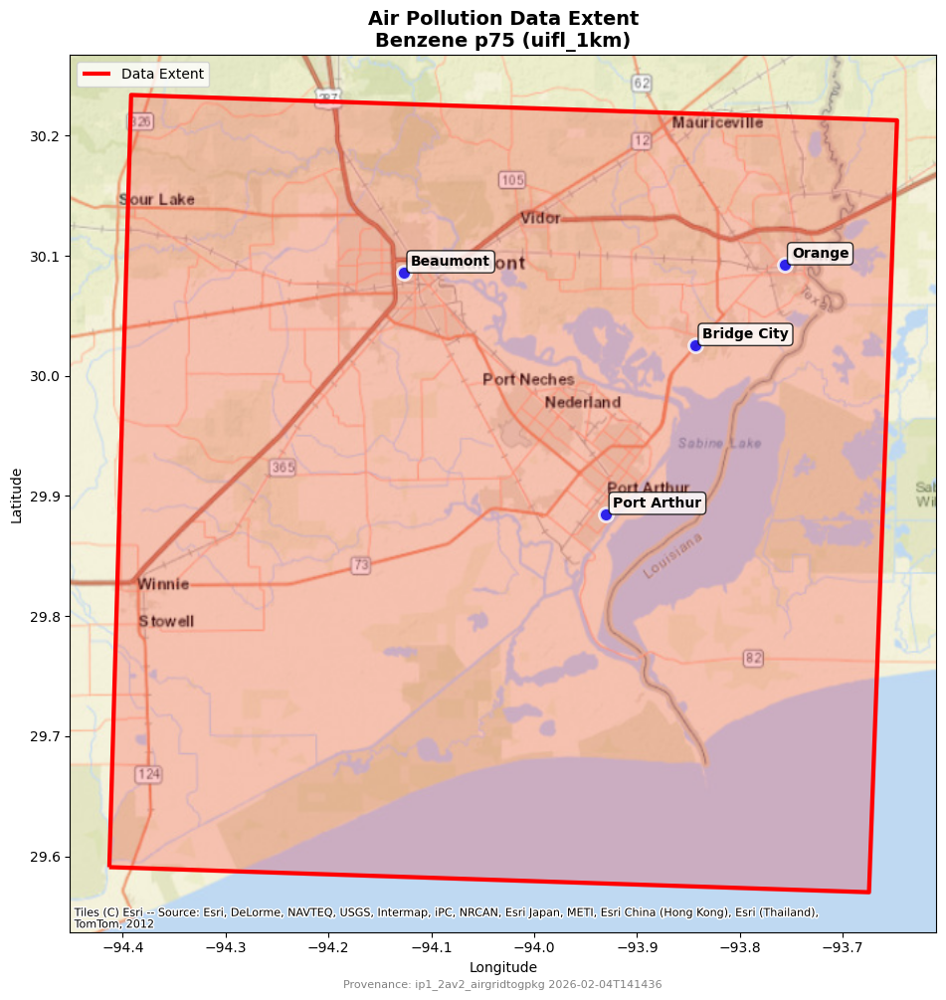

In [13]:
# Test the updated functions with WGS84 (standard lat/lon decimal degrees)
extent_gdf_wgs84 = plot_data_extent_on_basemap('uifl_1km', 'Benzene', 'p75')

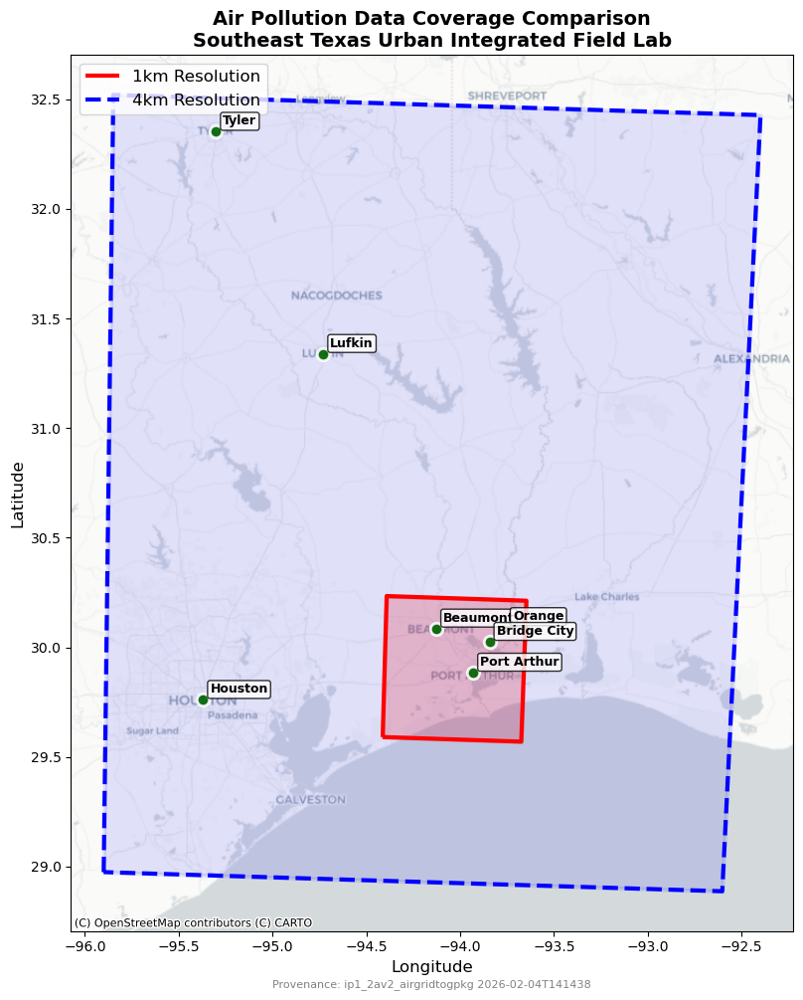

Data Coverage Comparison:
  1km Resolution Area: 5.18e+09 square units
  4km Resolution Area: 1.28e+11 square units
  Coverage Overlap: Yes


In [14]:
plot_multiple_extents_comparison()

# Convert GEOTiff into Gridded Vector with unique ID for each grid


In [15]:
# Convert first 4km geotiff to vector grid with unique polygon for each cell
import numpy as np
from shapely.geometry import Polygon
import geopandas as gpd

def create_grid_polygons_from_raster(raster_data, resolution):
    """
    Convert raster cells to vector polygons with unique IDs, including resolution.

    Args:
        raster_data: Dictionary containing raster information.
        resolution: String representing the resolution (e.g., 'uifl_4km').

    Returns:
        GeoDataFrame with polygon for each grid cell.
    """
    # Get raster properties
    transform = raster_data['transform']
    data_array = raster_data['data'][0]  # Get first band
    height, width = data_array.shape
    crs = raster_data['crs']

    print(f"Creating vector grid from raster:")
    print(f"  Dimensions: {width} x {height} = {width * height:,} cells")
    print(f"  CRS: {crs}")
    print(f"  Cell size: {abs(transform[0]):.1f} x {abs(transform[4]):.1f} units")

    # Lists to store polygon data
    polygons = []
    grid_ids = []
    row_indices = []
    col_indices = []

    # Get cell dimensions
    cell_width = abs(transform[0])   # x-direction pixel size
    cell_height = abs(transform[4])  # y-direction pixel size

    # Get upper-left corner coordinates
    x_origin = transform[2]  # x-coordinate of upper-left corner
    y_origin = transform[5]  # y-coordinate of upper-left corner

    print("Creating polygons for each grid cell...")

    # Create polygon for each raster cell
    for row in range(height):
        for col in range(width):
            # Calculate cell center coordinates
            x_center = x_origin + (col + 0.5) * cell_width
            y_center = y_origin - (row + 0.5) * cell_height  # Note: negative because y decreases

            # Calculate cell corner coordinates
            x_left = x_center - cell_width / 2
            x_right = x_center + cell_width / 2
            y_top = y_center + cell_height / 2
            y_bottom = y_center - cell_height / 2

            # Create polygon (counter-clockwise)
            cell_polygon = Polygon([
                (x_left, y_bottom),   # bottom-left
                (x_right, y_bottom),  # bottom-right
                (x_right, y_top),     # top-right
                (x_left, y_top),      # top-left
                (x_left, y_bottom)    # close polygon
            ])

            # Create unique grid ID with resolution
            grid_id = f"air{resolution}_{row:04d}_{col:04d}"

            # Store data
            polygons.append(cell_polygon)
            grid_ids.append(grid_id)
            row_indices.append(row)
            col_indices.append(col)

    # Create GeoDataFrame
    grid_gdf = gpd.GeoDataFrame({
        'air_grid_id': grid_ids,
        'row_idx': row_indices,
        'col_idx': col_indices,
        'geometry': polygons
    }, crs=crs)

    print(f"Successfully created {len(grid_gdf):,} grid polygons")

    return grid_gdf

# Get the first 4km geotiff
resolution_1km = 'uifl_1km'
first_species_1km = list(air_pollution_dict[resolution_1km].keys())[0]
first_statistic_1km = list(air_pollution_dict[resolution_1km][first_species_1km].keys())[0]

# Get the raster data
raster_data_1km = air_pollution_dict[resolution_1km][first_species_1km][first_statistic_1km]
# Create vector grid with resolution
grid_1km_gdf = create_grid_polygons_from_raster(raster_data_1km, resolution_1km)

# Get the first 4km geotiff
resolution_4km = 'uifl_4km'
first_species_4km = list(air_pollution_dict[resolution_4km].keys())[0]
first_statistic_4km = list(air_pollution_dict[resolution_4km][first_species_4km].keys())[0]

# Get the raster data
raster_data_4km = air_pollution_dict[resolution_4km][first_species_4km][first_statistic_4km]

# Create vector grid with resolution
grid_4km_gdf = create_grid_polygons_from_raster(raster_data_4km, resolution_4km)

Creating vector grid from raster:
  Dimensions: 72 x 72 = 5,184 cells
  CRS: PROJCS["unknown",GEOGCS["unknown",DATUM["unknown",SPHEROID["unknown",6370000,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",40],PARAMETER["central_meridian",-97],PARAMETER["standard_parallel_1",33],PARAMETER["standard_parallel_2",45],PARAMETER["false_easting",-252000],PARAMETER["false_northing",1152000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
  Cell size: 1000.0 x 1000.0 units
Creating polygons for each grid cell...
Successfully created 5,184 grid polygons
Creating vector grid from raster:
  Dimensions: 81 x 99 = 8,019 cells
  CRS: PROJCS["unknown",GEOGCS["unknown",DATUM["unknown",SPHEROID["unknown",6370000,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of

In [16]:
# rename air_grid_id to air_grid_id1km
grid_1km_gdf = grid_1km_gdf.rename(columns={'air_grid_id': 'air_grid_id1km'})
grid_1km_gdf.head()

,air_grid_id1km,row_idx,col_idx,geometry
0,airuifl_1km_0000_0000,0,0,"POLYGON ((0 71000, 1000 71000, 1000 72000, 0 7..."
1,airuifl_1km_0000_0001,0,1,"POLYGON ((1000 71000, 2000 71000, 2000 72000, ..."
2,airuifl_1km_0000_0002,0,2,"POLYGON ((2000 71000, 3000 71000, 3000 72000, ..."
3,airuifl_1km_0000_0003,0,3,"POLYGON ((3000 71000, 4000 71000, 4000 72000, ..."
4,airuifl_1km_0000_0004,0,4,"POLYGON ((4000 71000, 5000 71000, 5000 72000, ..."


In [17]:
# reproject to ESPG:4326
grid_1km_gdf_wgs84 = grid_1km_gdf.to_crs(epsg=4326)
grid_1km_gdf_wgs84.head()

,air_grid_id1km,row_idx,col_idx,geometry
0,airuifl_1km_0000_0000,0,0,"POLYGON ((-94.39218 30.22502, -94.38184 30.224..."
1,airuifl_1km_0000_0001,0,1,"POLYGON ((-94.38184 30.22476, -94.3715 30.2245..."
2,airuifl_1km_0000_0002,0,2,"POLYGON ((-94.3715 30.2245, -94.36116 30.22425..."
3,airuifl_1km_0000_0003,0,3,"POLYGON ((-94.36116 30.22425, -94.35081 30.223..."
4,airuifl_1km_0000_0004,0,4,"POLYGON ((-94.35081 30.22399, -94.34047 30.223..."


In [18]:
# rename air_grid_id to air_grid_id4km
grid_4km_gdf = grid_4km_gdf.rename(columns={'air_grid_id': 'air_grid_id4km'})
grid_4km_gdf.head()

,air_grid_id4km,row_idx,col_idx,geometry
0,airuifl_4km_0000_0000,0,0,"POLYGON ((0 392000, 4000 392000, 4000 396000, ..."
1,airuifl_4km_0000_0001,0,1,"POLYGON ((4000 392000, 8000 392000, 8000 39600..."
2,airuifl_4km_0000_0002,0,2,"POLYGON ((8000 392000, 12000 392000, 12000 396..."
3,airuifl_4km_0000_0003,0,3,"POLYGON ((12000 392000, 16000 392000, 16000 39..."
4,airuifl_4km_0000_0004,0,4,"POLYGON ((16000 392000, 20000 392000, 20000 39..."


In [19]:
# reproject to ESPG:4326
grid_4km_gdf_wgs84 = grid_4km_gdf.to_crs(epsg=4326)
grid_4km_gdf_wgs84.head()

,air_grid_id4km,row_idx,col_idx,geometry
0,airuifl_4km_0000_0000,0,0,"POLYGON ((-95.84949 32.4834, -95.80688 32.4829..."
1,airuifl_4km_0000_0001,0,1,"POLYGON ((-95.80688 32.48294, -95.76427 32.482..."
2,airuifl_4km_0000_0002,0,2,"POLYGON ((-95.76427 32.48246, -95.72167 32.481..."
3,airuifl_4km_0000_0003,0,3,"POLYGON ((-95.72167 32.48196, -95.67906 32.481..."
4,airuifl_4km_0000_0004,0,4,"POLYGON ((-95.67906 32.48145, -95.63646 32.480..."


In [20]:
# Save vector grids to files for future use
import os

# Create output directory
output_dir = f"{programname}"

# Save 4km grid
grid_4km_filename = f"{programname}_grid_4km.gpkg"
grid_4km_filepath = os.path.join(output_dir, grid_4km_filename)
grid_4km_gdf_wgs84.to_file(grid_4km_filepath, driver='GPKG')

grid_1km_filename = f"{programname}_grid_1km.gpkg"
grid_1km_filepath = os.path.join(output_dir, grid_1km_filename)
grid_1km_gdf_wgs84.to_file(grid_1km_filepath, driver='GPKG')

# Step 3. Explore Data

Plotting full 1km grid with 5,184 grid cells

✓ Saved comparison map: ip1_2av2_airgridtogpkg\ip1_2av2_airgridtogpkg_vector_grids_comparison.png


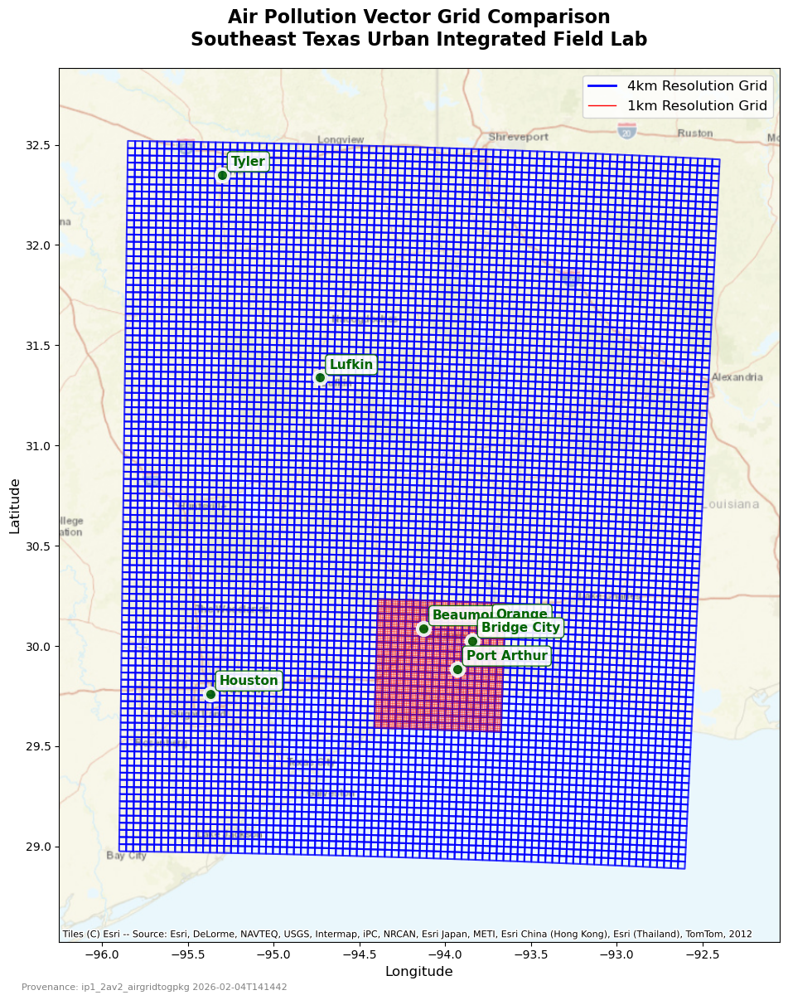


Vector Grid Comparison Summary:
  4km Grid: 8,019 total polygons
  1km Grid: 5,184 total polygons
  Resolution Ratio: 0.6x more cells in 1km
  Average cell area - 4km: 21.5 km², 1km: 1.3 km²


In [21]:
# Create comparison map showing both 4km and 1km vector grids

def plot_vector_grids_comparison():
    """Compare the vector polygon grids of 1km and 4km resolution data"""

    fig, ax = plt.subplots(figsize=(16, 12))

    # Convert both grids to WGS84 for plotting
    grid_4km_wgs84 = grid_4km_gdf.to_crs('EPSG:4326')

    # Check if 1km grid exists and convert to WGS84
    try:
        if 'grid_1km_gdf' in globals() and len(grid_1km_gdf) > 0:
            grid_1km_wgs84 = grid_1km_gdf.to_crs('EPSG:4326')
            print(f"Plotting full 1km grid with {len(grid_1km_wgs84):,} grid cells")
        else:
            grid_1km_wgs84 = None
            print("1km grid not available - plotting 4km grid only")
    except NameError:
        grid_1km_wgs84 = None
        print("1km grid not created yet - plotting 4km grid only")

    # Set axis limits to focus on the data extent BEFORE adding basemap
    bounds_4km = grid_4km_wgs84.total_bounds
    margin = 0.1  # Add 10% margin
    x_margin = (bounds_4km[2] - bounds_4km[0]) * margin
    y_margin = (bounds_4km[3] - bounds_4km[1]) * margin

    ax.set_xlim(bounds_4km[0] - x_margin, bounds_4km[2] + x_margin)
    ax.set_ylim(bounds_4km[1] - y_margin, bounds_4km[3] + y_margin)

    # Add base map first with proper transparency - prefer Esri WorldStreetMap for roads
    try:
        ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldStreetMap, alpha=0.6)
        basemap_source = "Esri WorldStreetMap"
    except Exception as e:
        print(f"Warning: Could not add base map: {e}")

    # Plot 4km grid boundaries (no fill for clarity, reduced alpha to show basemap)
    grid_4km_wgs84.boundary.plot(ax=ax, color='blue', linewidth=1.5, 
                                 label='4km Resolution Grid', alpha=0.8)

    # Plot 1km grid boundaries if available (plot full grid without sampling)
    if grid_1km_wgs84 is not None:
        grid_1km_wgs84.boundary.plot(ax=ax, color='red', linewidth=0.3, 
                                     label='1km Resolution Grid', alpha=0.7)

    # Add Texas cities for geographic context
    cities_data = []
    for city_name, coords in texas_cities.items():
        cities_data.append({
            'city': city_name,
            'geometry': sg.Point(coords['lon'], coords['lat'])
        })

    cities_gdf = gpd.GeoDataFrame(cities_data, crs='EPSG:4326')

    # Plot cities with larger markers
    cities_gdf.plot(ax=ax, color='darkgreen', markersize=120, alpha=0.9, 
                    edgecolor='white', linewidth=3, zorder=15)

    # Add city labels with better styling
    for idx, row in cities_gdf.iterrows():
        ax.annotate(row['city'], 
                    (row.geometry.x, row.geometry.y),
                    xytext=(8, 8), textcoords='offset points',
                    fontsize=11, fontweight='bold', color='darkgreen',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                              alpha=0.9, edgecolor='darkgreen'),
                    zorder=16)

    # Set plot properties
    ax.set_title('Air Pollution Vector Grid Comparison\nSoutheast Texas Urban Integrated Field Lab', 
                 fontsize=16, fontweight='bold', pad=20)

    # Create custom legend
    legend_elements = [
        plt.Line2D([0], [0], color='blue', linewidth=2, label='4km Resolution Grid'),
    ]

    if grid_1km_wgs84 is not None:
        legend_elements.append(
            plt.Line2D([0], [0], color='red', linewidth=1, label='1km Resolution Grid')
        )

    # Add provenance note
    date = datetime.now().strftime("%Y-%m-%dT%H%M%S")
    fig.text(0.2, -0.001, f"Provenance: {programname} {date}", ha='left', va='bottom', fontsize=8, color='gray')

    ax.legend(handles=legend_elements, loc='upper right', fontsize=12)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)

    plt.tight_layout()

    # Save the map to output folder
    map_filename = f"{programname}_vector_grids_comparison.png"
    map_filepath = os.path.join(output_dir, map_filename)
    plt.savefig(map_filepath, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"\n✓ Saved comparison map: {map_filepath}")

    plt.show()

    # Print comparison information
    print(f"\nVector Grid Comparison Summary:")
    print(f"  4km Grid: {len(grid_4km_gdf):,} total polygons")
    try:
        if 'grid_1km_gdf' in globals() and len(grid_1km_gdf) > 0:
            print(f"  1km Grid: {len(grid_1km_gdf):,} total polygons")
            print(f"  Resolution Ratio: {len(grid_1km_gdf) / len(grid_4km_gdf):.1f}x more cells in 1km")

            # Calculate average grid cell areas
            area_4km = grid_4km_gdf.to_crs('EPSG:3857').area.mean() / 1_000_000  # Convert to km²
            area_1km = grid_1km_gdf.to_crs('EPSG:3857').area.mean() / 1_000_000
            print(f"  Average cell area - 4km: {area_4km:.1f} km², 1km: {area_1km:.1f} km²")
        else:
            print("  1km Grid: Not created yet")
    except NameError:
        print("  1km Grid: Variable not defined")

plot_vector_grids_comparison()

Zooming to 1km grid extent with 5,184 grid cells
Using Esri WorldStreetMap basemap
\n✓ Saved zoomed comparison map: ip1_2av2_airgridtogpkg\ip1_2av2_airgridtogpkg_vector_grids_comparison_zoomed.png


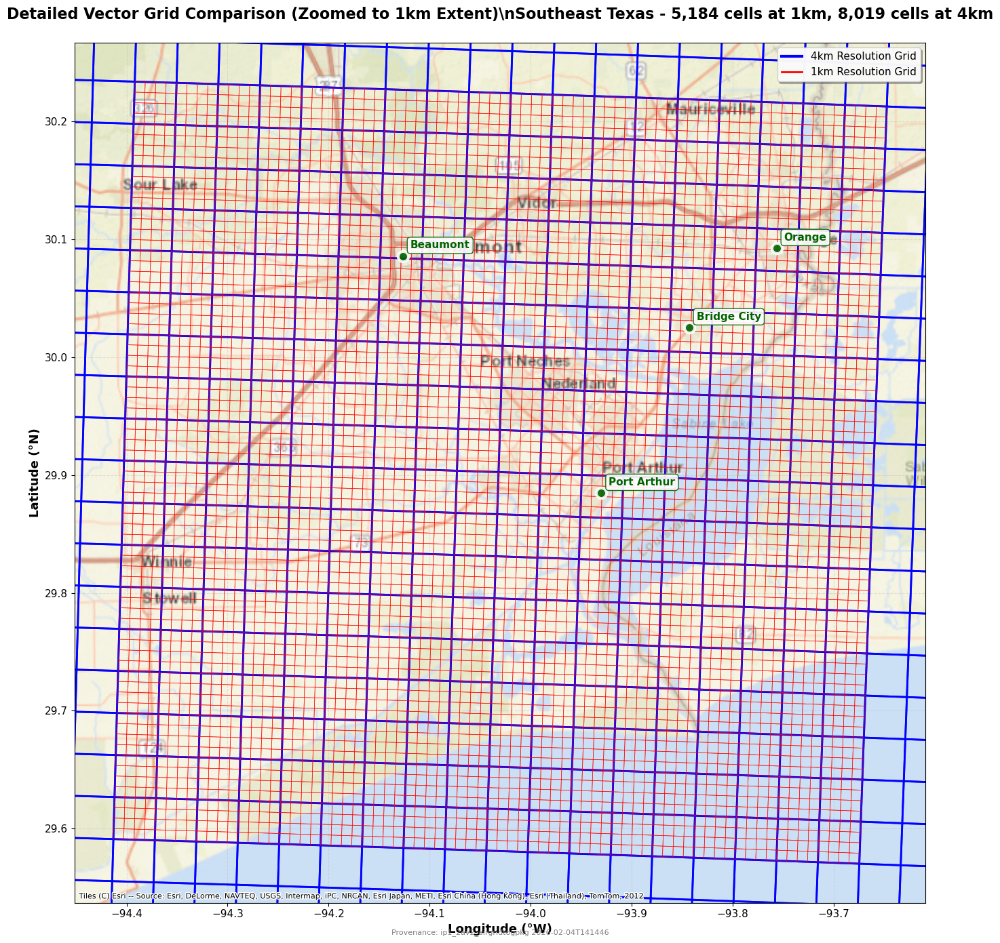

\n======================================================================
ZOOMED VECTOR GRID COMPARISON
Zoom extent: -94.4131°W to -93.6473°W, 29.5701°N to 30.2340°N
Map area: ~85 km × 74 km
\nGrid Details:
  4km Grid: 8,019 total polygons
  1km Grid: 5,184 total polygons
  Resolution Factor: 0.6x more detail in 1km
  Grid Density: 4km = 1.28 cells/km², 1km = 0.83 cells/km²


In [22]:
# Create zoomed-in comparison map focusing on 1km grid extent
from datetime import datetime
def plot_vector_grids_comparison_zoomed(overlay_tfsites=False):
    """Compare vector grids zoomed to 1km resolution extent with basemap

    Args:
        overlay_tfsites (bool): If True, overlay the `tfsites_gdf` task force sites.
    """

    fig, ax = plt.subplots(figsize=(18, 14))

    # Convert both grids to WGS84 for plotting
    grid_4km_wgs84 = grid_4km_gdf.to_crs('EPSG:4326')

    # Check if 1km grid exists and convert to WGS84
    grid_1km_wgs84 = None
    zoom_bounds = None

    try:
        if 'grid_1km_gdf' in globals() and len(grid_1km_gdf) > 0:
            grid_1km_wgs84 = grid_1km_gdf.to_crs('EPSG:4326')
            zoom_bounds = grid_1km_wgs84.total_bounds
            print(f"Zooming to 1km grid extent with {len(grid_1km_wgs84):,} grid cells")
        else:
            # Fallback to 4km bounds if 1km not available
            zoom_bounds = grid_4km_wgs84.total_bounds
            print("1km grid not available - using 4km grid extent")
    except NameError:
        zoom_bounds = grid_4km_wgs84.total_bounds
        print("1km grid not created yet - using 4km grid extent")

    # Set the axis limits first for proper basemap loading
    margin = 0.05  # 5% margin around the data
    x_margin = (zoom_bounds[2] - zoom_bounds[0]) * margin
    y_margin = (zoom_bounds[3] - zoom_bounds[1]) * margin

    ax.set_xlim(zoom_bounds[0] - x_margin, zoom_bounds[2] + x_margin)
    ax.set_ylim(zoom_bounds[1] - y_margin, zoom_bounds[3] + y_margin)

    # Add high-resolution base map (prefer Esri WorldStreetMap for road detail)
    try:
        ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldStreetMap, alpha=0.8)
        basemap_source = "Esri WorldStreetMap"
        print("Using Esri WorldStreetMap basemap")
    except:
        try:
            ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldImagery, alpha=0.8)
            basemap_source = "Esri World Imagery"
            print("Using satellite imagery basemap")
        except:
            try:
                ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.8)
                basemap_source = "OpenStreetMap"
                print("Using OpenStreetMap basemap")
            except Exception as e:
                print(f"Warning: Could not add base map: {e}")
                basemap_source = "None"

    # Plot 4km grid boundaries (thicker lines for visibility at zoom level)
    grid_4km_wgs84.boundary.plot(ax=ax, color='blue', linewidth=2.0, 
                                 label='4km Resolution Grid', alpha=0.9)

    # Plot 1km grid boundaries if available (finer lines but still visible)
    if grid_1km_wgs84 is not None:
        grid_1km_wgs84.boundary.plot(ax=ax, color='red', linewidth=0.5, 
                                    label='1km Resolution Grid', alpha=0.8)

    # Add Texas cities for geographic context
    cities_data = []
    for city_name, coords in texas_cities.items():
        cities_data.append({
            'city': city_name,
            'geometry': sg.Point(coords['lon'], coords['lat'])
        })

    cities_gdf = gpd.GeoDataFrame(cities_data, crs='EPSG:4326')

    # Plot cities with larger markers
    cities_gdf.plot(ax=ax, color='darkgreen', markersize=120, alpha=0.9, 
                    edgecolor='white', linewidth=3, zorder=15)

    # Add city labels with better styling
    for idx, row in cities_gdf.iterrows():
        ax.annotate(row['city'], 
                    (row.geometry.x, row.geometry.y),
                    xytext=(8, 8), textcoords='offset points',
                    fontsize=11, fontweight='bold', color='darkgreen',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                              alpha=0.9, edgecolor='darkgreen'),
                    zorder=16)

    # Optionally overlay task-force sites if requested and available
    if overlay_tfsites:
        try:
            if 'tfsites_gdf' in globals() and len(tfsites_gdf) > 0:
                tfsites_wgs = tfsites_gdf.to_crs('EPSG:4326')
                tfsites_wgs.plot(ax=ax, color='yellow', markersize=120, marker='*', 
                                  edgecolor='black', linewidth=0.5, zorder=20)
                print(f"Overlayed {len(tfsites_wgs):,} task force sites")
            else:
                print("tfsites_gdf not available; overlay skipped")
        except Exception as e:
            print(f"Could not plot tfsites_gdf: {e}")

    # Set enhanced plot properties
    if grid_1km_wgs84 is not None:
        title_text = f'Detailed Vector Grid Comparison (Zoomed to 1km Extent)\\nSoutheast Texas - {len(grid_1km_gdf):,} cells at 1km, {len(grid_4km_gdf):,} cells at 4km'
    else:
        title_text = 'Vector Grid Comparison (4km Resolution)\\nSoutheast Texas Urban Integrated Field Lab'

    ax.set_title(title_text, fontsize=16, fontweight='bold', pad=25)

    # Create enhanced legend
    legend_elements = [
        plt.Line2D([0], [0], color='blue', linewidth=3, label='4km Resolution Grid'),
    ]

    if grid_1km_wgs84 is not None:
        legend_elements.append(
            plt.Line2D([0], [0], color='red', linewidth=2, label='1km Resolution Grid')
        )

    if overlay_tfsites and 'tfsites_gdf' in globals():
        legend_elements.append(
            plt.Line2D([0], [0], marker='*', color='yellow', label='Task Force Sites', markeredgecolor='black', linestyle='None')
        )

    ax.legend(handles=legend_elements, loc='upper right', fontsize=11, 
              framealpha=0.95, fancybox=True, shadow=True)

    # Set enhanced axis labels
    ax.set_xlabel('Longitude (°W)', fontsize=13, fontweight='bold')
    ax.set_ylabel('Latitude (°N)', fontsize=13, fontweight='bold')

    # Add grid for reference
    ax.grid(True, alpha=0.3, linestyle='--')

    # Enhance tick labels
    ax.tick_params(axis='both', which='major', labelsize=11)

    # Add provenance note
    date = datetime.now().strftime("%Y-%m-%dT%H%M%S")
    fig.text(0.5, 0.01, f"Provenance: {programname} {date}", ha='center', va='bottom', fontsize=8, color='gray')

    plt.tight_layout()

    # Save the zoomed map to output folder
    zoom_map_filename = f"{programname}_vector_grids_comparison_zoomed.png"
    zoom_map_filepath = os.path.join(output_dir, zoom_map_filename)
    plt.savefig(zoom_map_filepath, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"\\n✓ Saved zoomed comparison map: {zoom_map_filepath}")

    plt.show()

    # Print enhanced comparison information
    print(f"\\n" + "="*70)
    print("ZOOMED VECTOR GRID COMPARISON")
    print("="*70)
    print(f"Zoom extent: {zoom_bounds[0]:.4f}°W to {zoom_bounds[2]:.4f}°W, {zoom_bounds[1]:.4f}°N to {zoom_bounds[3]:.4f}°N")
    print(f"Map area: ~{(zoom_bounds[2]-zoom_bounds[0])*111:.0f} km × {(zoom_bounds[3]-zoom_bounds[1])*111:.0f} km")

    print(f"\\nGrid Details:")
    print(f"  4km Grid: {len(grid_4km_gdf):,} total polygons")

    try:
        if 'grid_1km_gdf' in globals() and len(grid_1km_gdf) > 0:
            print(f"  1km Grid: {len(grid_1km_gdf):,} total polygons")
            print(f"  Resolution Factor: {len(grid_1km_gdf) / len(grid_4km_gdf):.1f}x more detail in 1km")

            # Calculate grid density in this view
            area_km2 = (zoom_bounds[2]-zoom_bounds[0]) * (zoom_bounds[3]-zoom_bounds[1]) * 111 * 111
            density_4km = len(grid_4km_gdf) / area_km2
            density_1km = len(grid_1km_gdf) / area_km2
            print(f"  Grid Density: 4km = {density_4km:.2f} cells/km², 1km = {density_1km:.2f} cells/km²")
        else:
            print("  1km Grid: Not available")
    except NameError:
        print("  1km Grid: Not created")

plot_vector_grids_comparison_zoomed()

In [23]:
# Create a site-centered zoom map
def plot_site_zoom(site_name, buffer_km=5, overlay_tfsites=True, basemap='esri_streets', save=True):
    """Create a zoomed comparison map centered on a named study site.

    Args:
        site_name (str): Name of the study site to center on (case-insensitive).
        buffer_km (float): Buffer radius around the site in kilometers.
        overlay_tfsites (bool): If True, overlay all `tfsites_gdf` points.
        basemap (str): Basemap choice: 'esri_streets', 'esri_imagery', 'osm'.
        save (bool): If True, save the resulting map to the output directory.

    Returns:
        Matplotlib figure and axis (fig, ax) if successful, else (None, None).
    """
    # Verify tfsites_gdf exists
    if 'tfsites_gdf' not in globals():
        print("tfsites_gdf not found in the environment. Cannot locate study site.")
        return None, None

    # Try to find a likely name column
    name_cols = [c for c in tfsites_gdf.columns if str(c).lower() in ('name','site','site_name','sitename','title')]
    match_col = None
    if name_cols:
        match_col = name_cols[0]
    else:
        # fallback: try any string column
        for c in tfsites_gdf.columns:
            if tfsites_gdf[c].dtype == object:
                match_col = c
                break

    if match_col is None:
        print('No suitable name column found in tfsites_gdf; cannot match site_name')
        return None, None

    # Case-insensitive match
    matches = tfsites_gdf[tfsites_gdf[match_col].str.lower() == site_name.lower()]
    if len(matches) == 0:
        # try contains
        matches = tfsites_gdf[tfsites_gdf[match_col].str.lower().str.contains(site_name.lower(), na=False)]
    if len(matches) == 0:
        print(f"No study site matching '{site_name}' found in {match_col}")
        return None, None

    site_row = matches.iloc[0]
    site_geom = site_row.geometry

    # Project to metric CRS for buffering (Web Mercator)
    try:
        site_proj = gpd.GeoSeries([site_geom], crs=tfsites_gdf.crs).to_crs(epsg=3857).iloc[0]
    except Exception:
        site_proj = gpd.GeoSeries([site_geom], crs='EPSG:4326').to_crs(epsg=3857).iloc[0]

    buffer_m = buffer_km * 1000.0
    buffer_proj = site_proj.buffer(buffer_m)

    # Bring buffer back to WGS84 for plotting limits
    buffer_wgs = gpd.GeoSeries([buffer_proj], crs='EPSG:3857').to_crs(epsg=4326).iloc[0]
    zoom_bounds = buffer_wgs.bounds  # minx, miny, maxx, maxy

    # Prepare plot
    fig, ax = plt.subplots(figsize=(14, 12))

    # Set axis limits BEFORE adding basemap (contextily needs this to know which tiles to download)
    minx, miny, maxx, maxy = zoom_bounds
    xpad = (maxx - minx) * 0.08
    ypad = (maxy - miny) * 0.08
    ax.set_xlim(minx - xpad, maxx + xpad)
    ax.set_ylim(miny - ypad, maxy + ypad)

    # Choose basemap provider
    provider = None
    if basemap == 'esri_streets':
        provider = ctx.providers.Esri.WorldStreetMap
    elif basemap == 'esri_imagery':
        provider = ctx.providers.Esri.WorldImagery
    elif basemap == 'osm':
        provider = ctx.providers.OpenStreetMap.Mapnik
    else:
        provider = ctx.providers.Esri.WorldStreetMap

    # Add basemap (try chosen provider, fallback to OSM)
    try:
        ctx.add_basemap(ax, crs='EPSG:4326', source=provider, alpha=0.8)
    except Exception:
        try:
            ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.8)
            print('Fell back to OpenStreetMap basemap')
        except Exception as e:
            print(f'Warning: Could not add any basemap: {e}')

    # Plot grids (convert to WGS84)
    try:
        g4 = grid_4km_gdf.to_crs(epsg=4326)
        g4.boundary.plot(ax=ax, color='blue', linewidth=1.2, label='4km grid')
    except Exception as e:
        print(f'Could not plot 4km grid: {e}')

    try:
        if 'grid_1km_gdf' in globals():
            g1 = grid_1km_gdf.to_crs(epsg=4326)
            g1.boundary.plot(ax=ax, color='red', linewidth=0.4, label='1km grid')
    except Exception as e:
        print(f'Could not plot 1km grid: {e}')

    # Plot the buffer as polygon
    gpd.GeoSeries([buffer_wgs], crs='EPSG:4326').boundary.plot(ax=ax, color='black', linewidth=1.0, linestyle='--')

    # Optionally overlay all task force sites and highlight the selected one
    if overlay_tfsites:
        try:
            tfs = tfsites_gdf.to_crs(epsg=4326)
            tfs.plot(ax=ax, color='yellow', markersize=70, marker='*', edgecolor='black', zorder=20, label='Task force sites')
            # highlight selected site
            sel = gpd.GeoDataFrame([site_row], crs=tfsites_gdf.crs).to_crs(epsg=4326)
            sel.plot(ax=ax, color='orange', markersize=150, marker='*', edgecolor='black', zorder=21, label=f"Selected: {site_row[match_col]}")
            # annotate
            for _, r in sel.iterrows():
                # Use centroid for Polygon geometries, or x/y for Points
                if hasattr(r.geometry, 'x'):
                    x, y = r.geometry.x, r.geometry.y
                else:
                    centroid = r.geometry.centroid
                    x, y = centroid.x, centroid.y
                ax.annotate(str(r[match_col]), (x, y), xytext=(5,5), textcoords='offset points', fontsize=10, fontweight='bold')
        except Exception as e:
            print(f'Could not overlay tfsites_gdf: {e}')

    # Axis limits already set before basemap (no need to set again)

    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f"Site zoom: {site_row[match_col]} (±{buffer_km} km)")

    # Legend and provenance
    ax.legend(loc='upper right')
    date = datetime.now().strftime('%Y-%m-%dT%H%M%S')
    fig.text(0.5, 0.01, f"Provenance: {programname} {date}", ha='center', va='bottom', fontsize=8, color='gray')

    plt.tight_layout()

    if save:
        safe_name = str(site_row[match_col]).replace(' ', '_')
        fname = f"{programname}_sitezoom_{safe_name}.png"
        fpath = os.path.join(output_dir, fname)
        plt.savefig(fpath, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"Saved site zoom map: {fpath}")

    plt.show()

    return fig, ax

# Example usage (uncomment to run):
# plot_site_zoom('Bridge City', buffer_km=5, overlay_tfsites=True, basemap='esri_streets')

Zooming to 1km grid extent with 5,184 grid cells
Using Esri WorldStreetMap basemap
Overlayed 2 task force sites
\n✓ Saved zoomed comparison map: ip1_2av2_airgridtogpkg\ip1_2av2_airgridtogpkg_vector_grids_comparison_zoomed.png


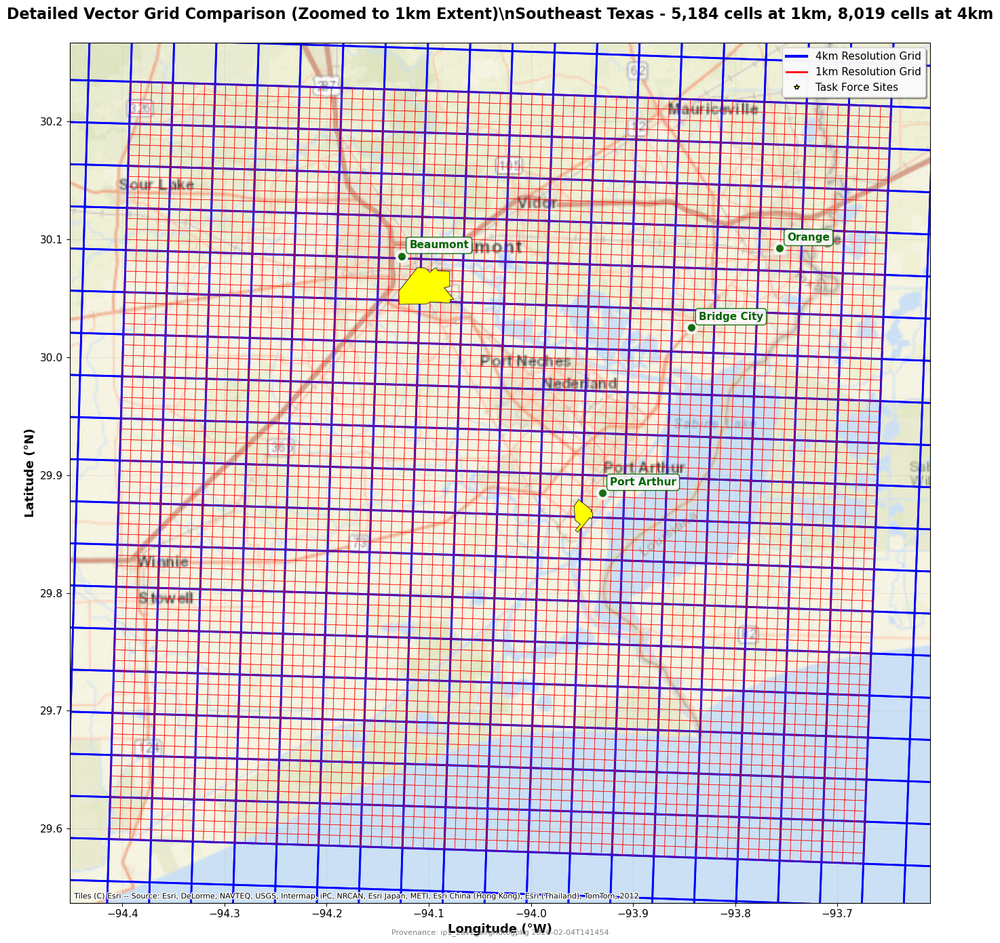

\n======================================================================
ZOOMED VECTOR GRID COMPARISON
Zoom extent: -94.4131°W to -93.6473°W, 29.5701°N to 30.2340°N
Map area: ~85 km × 74 km
\nGrid Details:
  4km Grid: 8,019 total polygons
  1km Grid: 5,184 total polygons
  Resolution Factor: 0.6x more detail in 1km
  Grid Density: 4km = 1.28 cells/km², 1km = 0.83 cells/km²


In [24]:
plot_vector_grids_comparison_zoomed(overlay_tfsites=True)

In [25]:
# Create a site-centered zoom map
def plot_site_zoom(site_name, buffer_km=5, overlay_tfsites=True, save=True):
    """Create a zoomed comparison map centered on a named study site.

    Args:
        site_name (str): Name of the study site to center on (case-insensitive).
        buffer_km (float): Buffer radius around the site in kilometers.
        overlay_tfsites (bool): If True, overlay all `tfsites_gdf` points.
        save (bool): If True, save the resulting map to the output directory.

    Returns:
        Matplotlib figure and axis (fig, ax) if successful, else (None, None).
    """
    # Verify tfsites_gdf exists
    if 'tfsites_gdf' not in globals():
        print("tfsites_gdf not found in the environment. Cannot locate study site.")
        return None, None

    # Try to find a likely name column
    name_cols = [c for c in tfsites_gdf.columns if str(c).lower() in ('name','site','site_name','sitename','title')]
    match_col = None
    if name_cols:
        match_col = name_cols[0]
    else:
        # fallback: try any string column
        for c in tfsites_gdf.columns:
            if tfsites_gdf[c].dtype == object:
                match_col = c
                break

    if match_col is None:
        print('No suitable name column found in tfsites_gdf; cannot match site_name')
        return None, None

    # Case-insensitive match
    matches = tfsites_gdf[tfsites_gdf[match_col].str.lower() == site_name.lower()]
    if len(matches) == 0:
        # try contains
        matches = tfsites_gdf[tfsites_gdf[match_col].str.lower().str.contains(site_name.lower(), na=False)]
    if len(matches) == 0:
        print(f"No study site matching '{site_name}' found in {match_col}")
        return None, None

    site_row = matches.iloc[0]
    site_geom = site_row.geometry

    # Project to metric CRS for buffering (Web Mercator)
    try:
        site_proj = gpd.GeoSeries([site_geom], crs=tfsites_gdf.crs).to_crs(epsg=3857).iloc[0]
    except Exception:
        site_proj = gpd.GeoSeries([site_geom], crs='EPSG:4326').to_crs(epsg=3857).iloc[0]

    buffer_m = buffer_km * 1000.0
    buffer_proj = site_proj.buffer(buffer_m)

    # Bring buffer back to WGS84 for plotting limits
    buffer_wgs = gpd.GeoSeries([buffer_proj], crs='EPSG:3857').to_crs(epsg=4326).iloc[0]
    zoom_bounds = buffer_wgs.bounds  # minx, miny, maxx, maxy

    # Prepare plot
    fig, ax = plt.subplots(figsize=(14, 12))

    # Set axis limits BEFORE adding basemap (contextily needs this to know which tiles to download)
    minx, miny, maxx, maxy = zoom_bounds
    xpad = (maxx - minx) * 0.08
    ypad = (maxy - miny) * 0.08
    ax.set_xlim(minx - xpad, maxx + xpad)
    ax.set_ylim(miny - ypad, maxy + ypad)

    # Add basemap
    try:
        ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldStreetMap, alpha=0.8)
    except Exception:
        print("Warning: Could not add base map.")
        pass

    # Plot grids (convert to WGS84)
    try:
        g4 = grid_4km_gdf.to_crs(epsg=4326)
        g4.boundary.plot(ax=ax, color='blue', linewidth=1.2, label='4km grid')
    except Exception as e:
        print(f'Could not plot 4km grid: {e}')

    try:
        if 'grid_1km_gdf' in globals():
            g1 = grid_1km_gdf.to_crs(epsg=4326)
            g1.boundary.plot(ax=ax, color='red', linewidth=0.4, label='1km grid')
    except Exception as e:
        print(f'Could not plot 1km grid: {e}')

    # Plot the buffer as polygon
    gpd.GeoSeries([buffer_wgs], crs='EPSG:4326').boundary.plot(ax=ax, color='black', linewidth=1.0, linestyle='--')

    # Optionally overlay all task force sites and highlight the selected one
    if overlay_tfsites:
        try:
            tfs = tfsites_gdf.to_crs(epsg=4326)
            tfs.plot(ax=ax, color='yellow', markersize=70, marker='*', edgecolor='black', zorder=20, label='Task force sites', alpha=0.5)
            # highlight selected site
            sel = gpd.GeoDataFrame([site_row], crs=tfsites_gdf.crs).to_crs(epsg=4326)
            sel.plot(ax=ax, color='orange', markersize=150, marker='*', 
                     edgecolor='black', zorder=21, label=f"Selected: {site_row[match_col]}",
                     alpha=0.3)
            # annotate
            for _, r in sel.iterrows():
                # Use centroid for Polygon geometries, or x/y for Points
                if hasattr(r.geometry, 'x'):
                    x, y = r.geometry.x, r.geometry.y
                else:
                    centroid = r.geometry.centroid
                    x, y = centroid.x, centroid.y
                ax.annotate(str(r[match_col]), (x, y), xytext=(5,5), textcoords='offset points', fontsize=10, fontweight='bold')
        except Exception as e:
            print(f'Could not overlay tfsites_gdf: {e}')

    # Axis limits already set before basemap (no need to set again)

    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f"Site zoom: {site_row[match_col]} (±{buffer_km} km)")

    # Legend and provenance
    ax.legend(loc='upper right')
    date = datetime.now().strftime('%Y-%m-%dT%H%M%S')
    fig.text(0.5, 0.01, f"Provenance: {programname} {date}", ha='center', va='bottom', fontsize=8, color='gray')

    plt.tight_layout()

    if save:
        safe_name = str(site_row[match_col]).replace(' ', '_')
        fname = f"{programname}_sitezoom_{safe_name}.png"
        fpath = os.path.join(output_dir, fname)
        plt.savefig(fpath, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"Saved site zoom map: {fpath}")

    plt.show()

    return fig, ax

# Example usage (uncomment to run):
# plot_site_zoom('Bridge City', buffer_km=5, overlay_tfsites=True)


In [26]:
tfsites_gdf.head()

,Shape_Leng,Shape_Area,Site_Name,geometry
0,0.0,0.0,West Port Arthur,"POLYGON Z ((-10458830.588 3488032.728 0, -1045..."
1,0.0,0.0,Southeast Beaumont,"POLYGON Z ((-10476419.371 3513315.472 0, -1047..."


C:\Users\nathanael99\AppData\Local\Temp\ipykernel_29500\3313714678.py:123: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper right')


Saved site zoom map: ip1_2av2_airgridtogpkg\ip1_2av2_airgridtogpkg_sitezoom_West_Port_Arthur.png


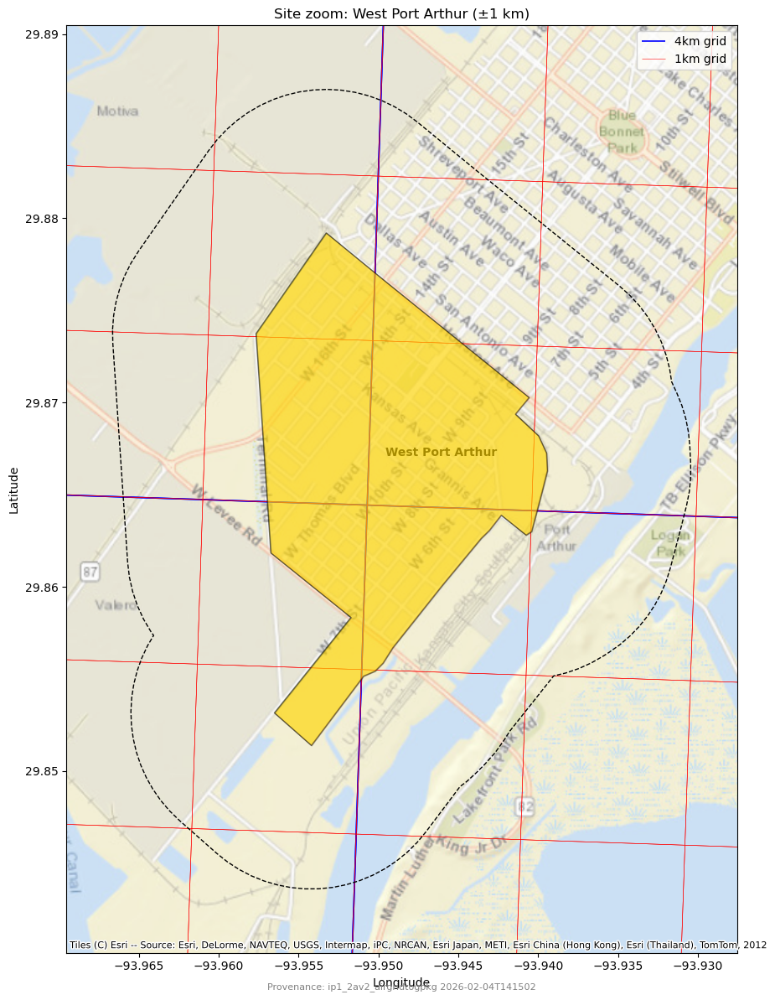

(<Figure size 1400x1200 with 1 Axes>,
 <Axes: title={'center': 'Site zoom: West Port Arthur (±1 km)'}, xlabel='Longitude', ylabel='Latitude'>)

In [27]:
plot_site_zoom(site_name = 'West Port Arthur', buffer_km = 1, overlay_tfsites=True)

In [28]:
# print the second site name
second_site_name = tfsites_gdf.iloc[1]['site_name'] if 'site_name' in tfsites_gdf.columns else tfsites_gdf.iloc[1][tfsites_gdf.select_dtypes(include=['object']).columns[0]]
print(f"Second site name: {second_site_name}")

Second site name: Southeast Beaumont


C:\Users\nathanael99\AppData\Local\Temp\ipykernel_29500\3313714678.py:123: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc='upper right')


Saved site zoom map: ip1_2av2_airgridtogpkg\ip1_2av2_airgridtogpkg_sitezoom_Southeast_Beaumont.png


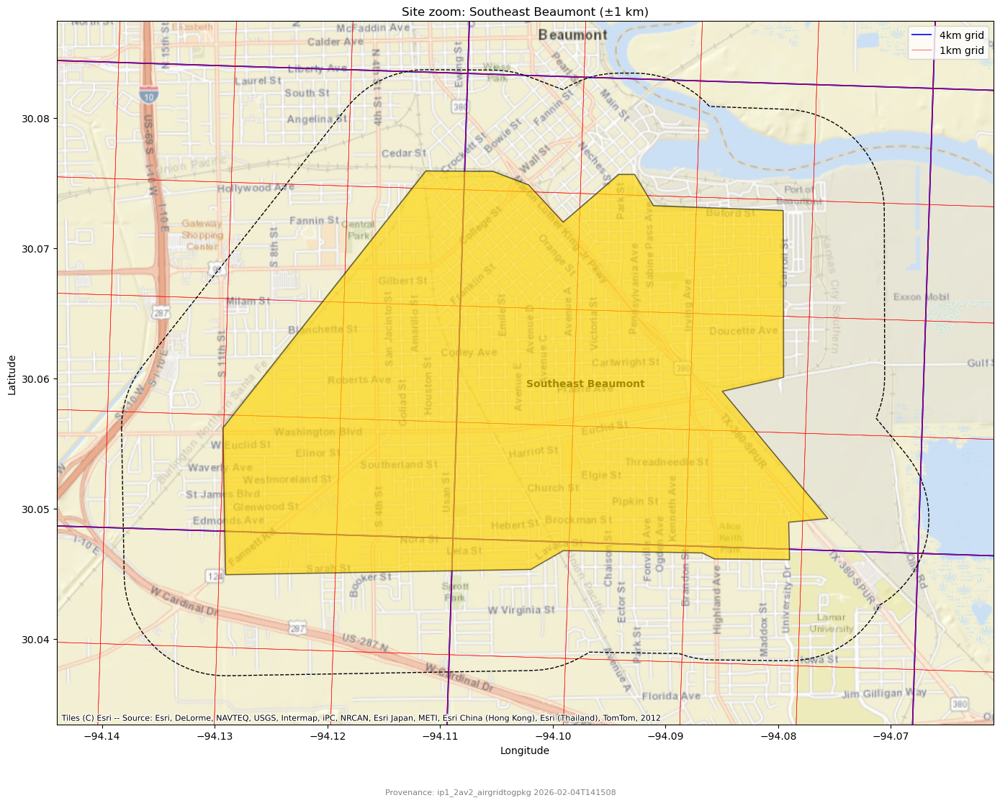

(<Figure size 1400x1200 with 1 Axes>,
 <Axes: title={'center': 'Site zoom: Southeast Beaumont (±1 km)'}, xlabel='Longitude', ylabel='Latitude'>)

In [29]:
plot_site_zoom(site_name = second_site_name, buffer_km = 1, overlay_tfsites=True)